# Prompt

For this project you will do color image processing using two input images. You will perform all the tasks described below in a Python Jupyter notebook for each input image. Make sure to display the output of each step. For steps 2 and 3 use the outputs of step 1. Perform step 4 twice using the output of step 2 once and the output of step 3 once.

1. Perform tone corrections and darken the bright regions and lighten the dark regions in the input images as described in Section 7.5. See Example 7.9.

2. Remember that you have already performed gray-scale image sharpening using the Laplacian operator in a previous homework. Perform image sharpening on each RGB color channel using the Laplacian operator and put the results together into a color image as described in Section 7.6. See Example 7.13.

3. Transform the RGB image to a HSI image and apply image sharpening to only the Intensity part and then replace the original Intensity with the sharpened Intensity in the HSI image. Then, convert back to an RGB image.

4. Use the edge detection technique by Di Zenzo, described in Section 7.7 on each output from step (3) above. You need to use equations 7.50 to 7.56 in your code. See Example 7.16.

For each input image, I expect to see a total of 5 processed images.


# Code

## Imports

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

from copy import deepcopy
from google.colab.patches import cv2_imshow
from math import sqrt, pi, exp, log
from scipy import signal

## Global Variables

In [2]:
# Directory
ROOT_DIR = "drive/MyDrive/Classes/CSCE 5225 Image Processing/Project/Part 2/"
IMG_PIANO_DIR = ROOT_DIR + "project2-piano.jpg"
IMG_ORCH_DIR = ROOT_DIR + "project2-orchestra.jpg"

# Image size
M = None
N = None
C = None
P = None
Q = None

## Load Images

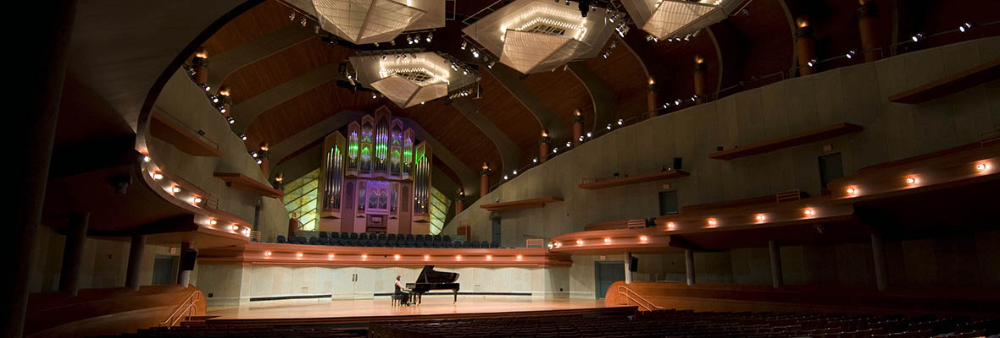

In [3]:
# Load Piano
img_piano = cv2.imread(IMG_PIANO_DIR)
cv2_imshow(img_piano)

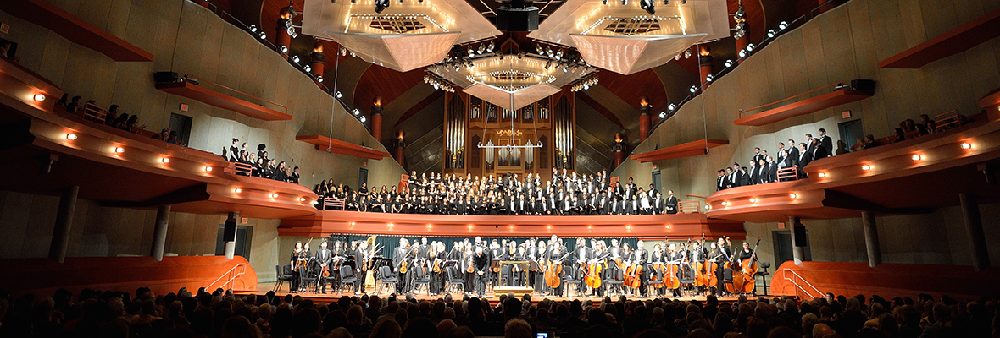

In [4]:
# Load Orchestra
img_orch = cv2.imread(IMG_ORCH_DIR)
cv2_imshow(img_orch)

In [5]:
# Get image size
M, N, C = img_piano.shape
P = 2 * M
Q = 2 * N

## 1 Perform tone corrections and darken the bright regions and lighten the dark regions in the input images.

In [6]:
# Transform function
def transform_intensity(x):
    a = 0.7
    b = 0.2
    return a * x + b

In [7]:
# Apply transform function
def adjust_img(img):
    for i in range(M):
        for j in range(N):
            for k in range(C):
                img[i, j, k] = transform_intensity(img[i, j, k] / 256) * 256
    return img

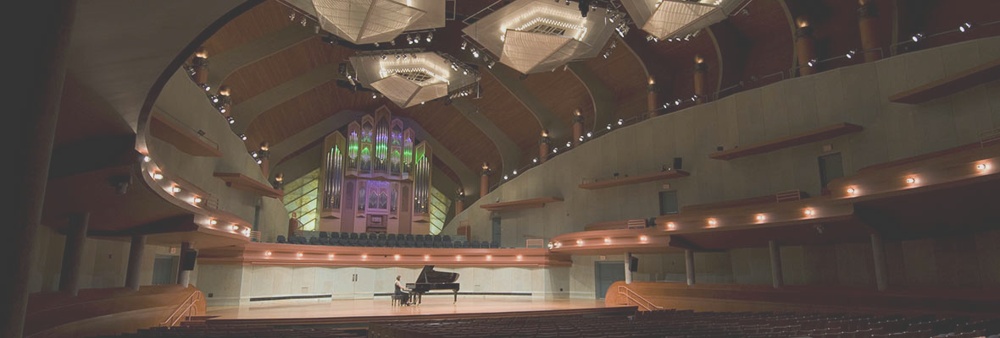

In [8]:
# Adjust piano
img_piano_adjust = adjust_img(deepcopy(img_piano))
cv2_imshow(img_piano_adjust)

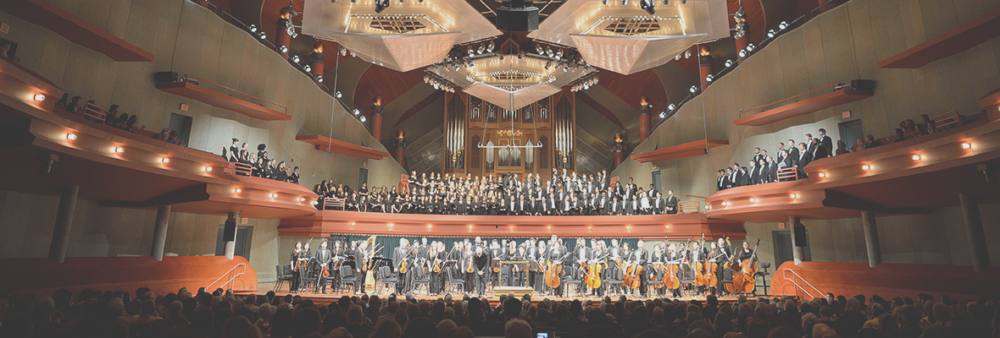

In [9]:
# Adjust orchestra
img_orch_adjust = adjust_img(deepcopy(img_orch))
cv2_imshow(img_orch_adjust)

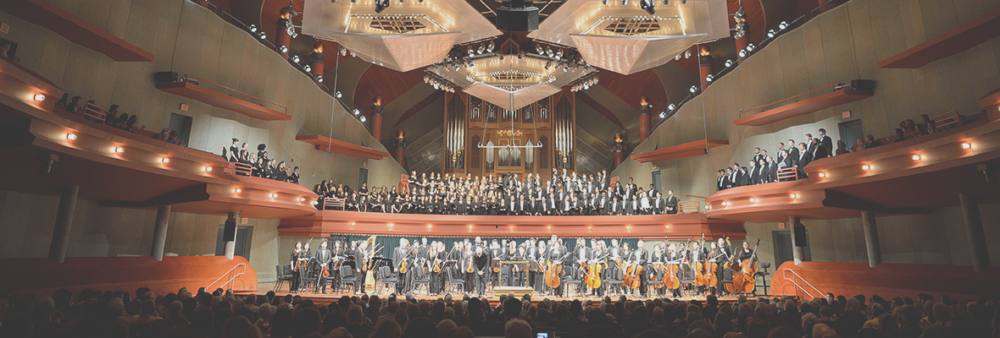

In [10]:
# Adjust orchestra
img_orch_adjust = adjust_img(deepcopy(img_orch))
cv2_imshow(img_orch_adjust)

## 2 Perform image sharpening on each RGB color channel using the Laplacian operator and put the results together into a color image.

### Homework 06 Code

In [11]:
# Pad image
def pad_img(img_inp, mirror=True): 
    img_pad = np.zeros((P, Q))

    # Mirror padding
    if mirror:

        # Flip vertically
        for i in range(M):
            for j in range(N):
                img_pad[i, j] = img_inp[i, j]
                img_pad[P-1-i, j] = img_inp[i, j]

        # Flip top and bottom horizontally
        for i in range(N):
            img_pad[:, Q-1-i] = img_pad[:, i]
    
    # Zero padding
    for i in range(M):
        for j in range(N):
            img_pad[i, j] = img_inp[i, j]

    return img_pad

In [12]:
# DFT function
def dft_simple(img):
    ft = np.fft.fft2(img)
    return np.fft.fftshift(ft)

In [13]:
def laplacian(img):
    kernel = np.zeros((P, Q))
    for x in range(P):
        for y in range(Q):
            kernel[x, y] = -4 * pi * ((x - (P / 2)) ** 2 + (y - (Q / 2) ** 2))

    adj = img * kernel
    m = np.max(adj)
    adj /= m
    adj = img - adj

    return img

In [14]:
# Inverse Discrete Fourier Transform
def idft_simple(img):
    ft = np.fft.ifftshift(img)
    return abs(np.fft.ifft2(ft))

### Apply Laplacian filter to color channels.

In [15]:
# Sharpen image function
def sharpen_channel(img_inp, mirror=True):

    # # Pad image
    img_pad = pad_img(img_inp, mirror)

    # DFT
    img_dft = dft_simple(img_pad)

    # # Convolve laplacian filter
    img_lap = laplacian(img_dft)

    # Obtain the filtered image by computing the IDFT
    img_lap_idft = idft_simple(img_lap)

    # # Extract the top left quadrant
    img_lap_trim = img_lap_idft[0:M, 0:N]

    return img_lap_trim

In [16]:
# Apply sharpen function across 3 channels
def sharpen_img(img, mirror=True):
    img = img / 256

    img_r = img[:, :, 0]
    img_g = img[:, :, 1]
    img_b = img[:, :, 2]

    img_r = sharpen_channel(img_r)
    img_g = sharpen_channel(img_g)
    img_b = sharpen_channel(img_b)

    # img = np.dstack([img_r.astype(int), img_g.astype(int), img_b.astype(int)])

    img[:, :, 0] = img_r
    img[:, :, 1] = img_g
    img[:, :, 2] = img_b

    return img * 256

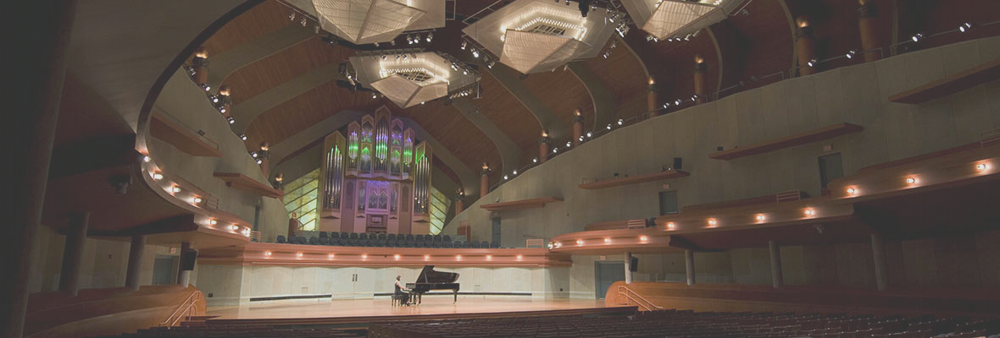

In [17]:
# Sharpen piano
img_paino_lap = sharpen_img(img_piano_adjust, mirror=True)
cv2_imshow(img_paino_lap)

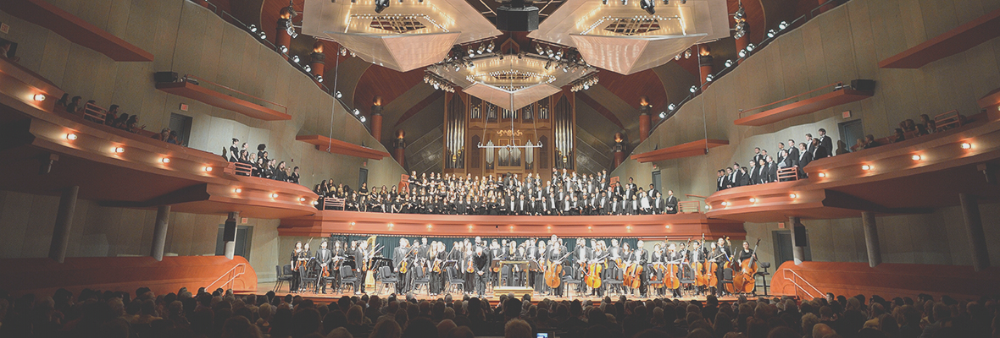

In [18]:
# Sharpen orchestra
img_orch_lap = sharpen_img(img_orch_adjust)
cv2_imshow(img_orch_lap)

## 3 Transform the RGB image to a HSI image and apply image sharpening to only the Intensity part and then replace the original Intensity with the sharpened Intensity in the HSI image. Then, convert back to an RGB image.

In [19]:
# Function to convert rgb to hsi
def rgb_to_hsi(img):
    # img_hsi = np.zeros((M, N, C))

    # # Normalize
    # img = img / 255

    # # Iterate
    # for i in range(M):
    #     for j in range(N):

    #         # RGB values
    #         R = img[i, j, 0]
    #         G = img[i, j, 1]
    #         B = img[i, j, 2]

    #         # H
    #         t = np.arccos((0.5 * ((R - G) + (R - B))) / sqrt((R - G) ** 2 + (R - B) * (G - B)))
    #         if G > B:
    #             img_hsi[i, j, 0] = t / 360
    #         else:
    #             img_hsi[i, j, 0] = (360 - t) / 360

    #         # S
    #         img_hsi[i, j, 1] = 1 - (3 / (R + G + B)) ** min(R, G, B)

    #         # I
    #         img_hsi[i, j, 2] = (1 / 3) * (R + G + B)

    #         for k in range(3):
    #             img_hsi[i, j, k] *= 255

    return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

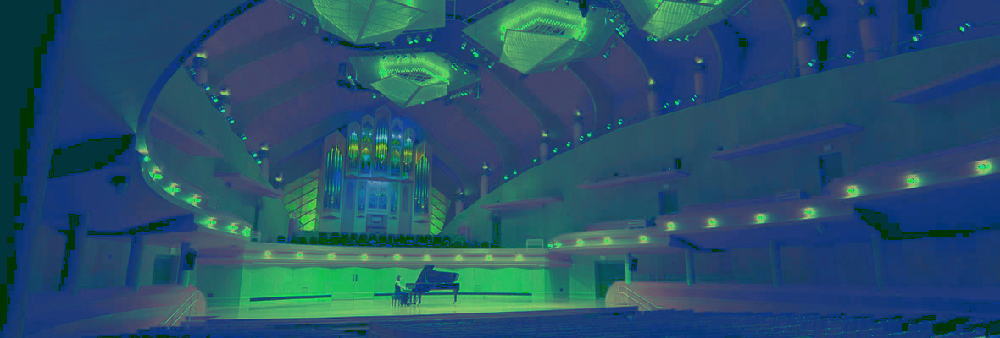

In [20]:
# Convert piano to hsi
img_piano_hsi = rgb_to_hsi(deepcopy(img_piano_adjust))
cv2_imshow(img_piano_hsi)

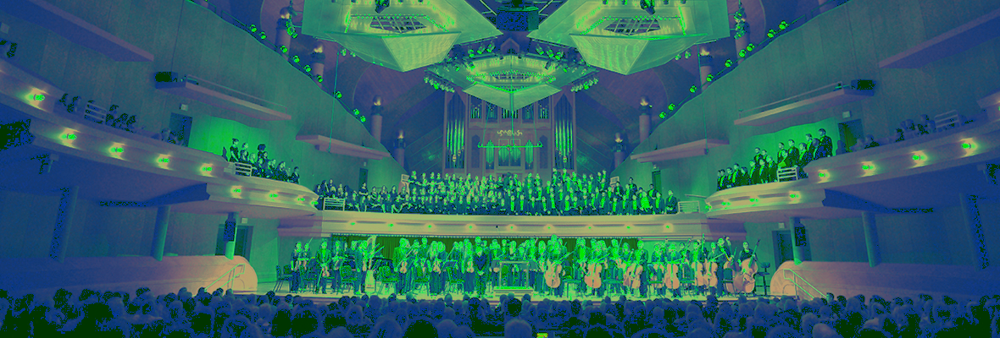

In [21]:
# Convert orchestra to hsi
img_orch_hsi = rgb_to_hsi(deepcopy(img_orch_adjust))
cv2_imshow(img_orch_hsi)

In [22]:
# Function to sharpen intensity only
def sharpen_i(img):
    I = deepcopy(img[:, :, 2])
    I = sharpen_channel(I)
    img[:, :, 2] = I
    return img

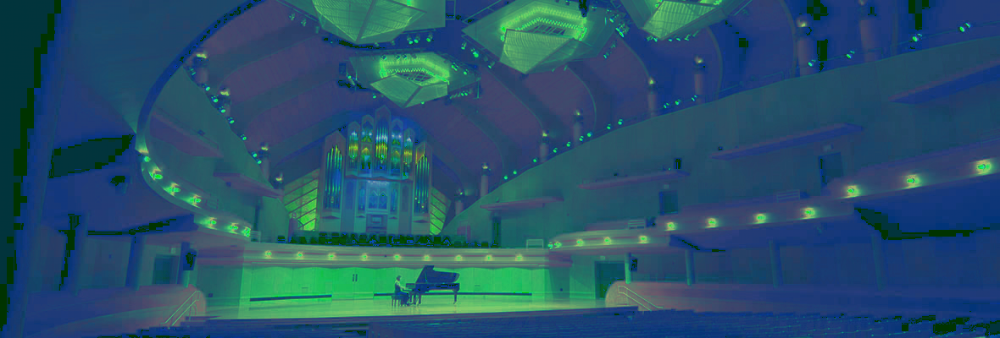

In [23]:
# Sharpen piano
img_piano_hsi_sharp = sharpen_i(deepcopy(img_piano_hsi))
cv2_imshow(img_piano_hsi_sharp)

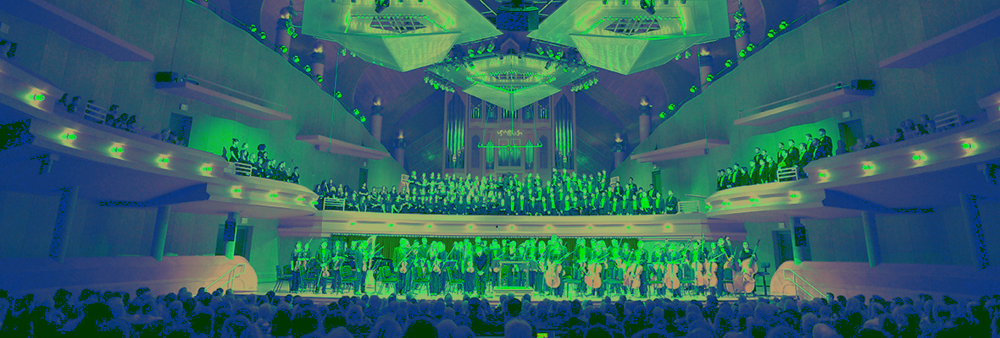

In [24]:
# Sharpen orchestra
img_orch_hsi_sharp = sharpen_i(deepcopy(img_orch_hsi))
cv2_imshow(img_orch_hsi_sharp)

In [25]:
# Function to convert hsi to rgb
def hsi_to_rgb(img):
    # img_rgb = np.zeros((M, N, C))

    # # Normalize
    # img = img / 255

    # # Iterate
    # for i in range(M):
    #     for j in range(N):

    #         # HSI values
    #         H = img[i, j, 0]
    #         S = img[i, j, 1]
    #         I = img[i, j, 2]

    #         # R
    #         img_rgb[i, j, 0] = I * (1 + ((S * np.cos(H)) / (np.cos(60 - H))))

    #         # B
    #         img_rgb[i, j, 2] = I * (1 - S)

    #         # G
    #         img_rgb[i, j, 1] = 3 * I - (img_rgb[i, j, 0] + img_rgb[i, j, 2])

    #         for k in range(3):
    #             img_rgb[i, j, k] *= 255

    return cv2.cvtColor(img, cv2.COLOR_HLS2RGB)

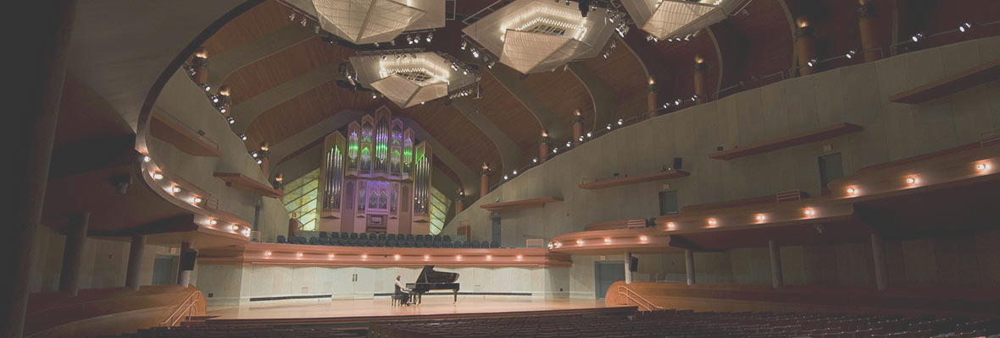

In [26]:
# Convert piano to rgb
img_piano_rgb_sharp = hsi_to_rgb(deepcopy(img_piano_hsi_sharp))
cv2_imshow(img_piano_rgb_sharp)

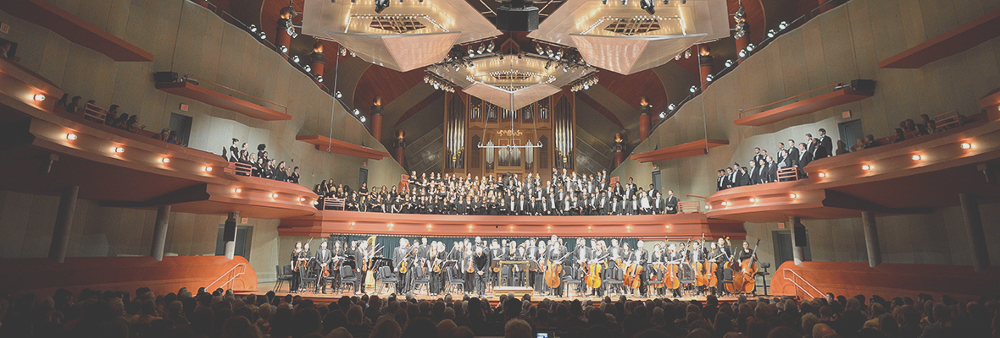

In [27]:
# Convert orchestra to rgb
img_orch_rgb_sharp = hsi_to_rgb(deepcopy(img_orch_hsi_sharp))
cv2_imshow(img_orch_rgb_sharp)

## 4 Use edge detection on each output from step (3) above.

In [28]:
# Get x gradients for a channeld
def grad_u(img, i):
    ker_x = [[1, 0, -1], 
             [2, 0, -2], 
             [1, 0, -1]
             ]
    u = signal.convolve2d(img[:, :, i], np.array(ker_x))
    return u

In [29]:
# Get y gradients for a channel
def grad_v(img, i):
    ker_y = [[ 1,  2,  1], 
             [ 0,  0,  0], 
             [-1, -2, -1]
             ]
    v = signal.convolve2d(img[:, :, i], np.array(ker_y))
    return v

In [30]:
# Function to get edges
def edges(img):

    # U gradients
    grad_x_r = grad_u(img, 0)
    grad_x_g = grad_u(img, 1)
    grad_x_b = grad_u(img, 2)

    # V gradients
    grad_y_r = grad_v(img, 0)
    grad_y_g = grad_v(img, 1)
    grad_y_b = grad_v(img, 2)

    # Equation 7-50
    u = grad_x_r + grad_x_g + grad_x_b

    # Equation 7-51
    v = grad_y_r + grad_y_g + grad_y_b

    # Equation 7-52
    g_xx = grad_x_r ** 2 + grad_x_g ** 2 + grad_x_b ** 2

    # Equation 7-53
    g_yy = grad_y_r ** 2 + grad_y_g ** 2 + grad_y_b ** 2

    # Equation 7-54
    g_xy = grad_x_r * grad_y_r + grad_x_g * grad_y_g + grad_x_b * grad_y_b

    # Equation 7-55
    t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy)) 

    # Equation 7-56
    f = np.sqrt(0.5 * ((g_xx + g_yy) + (g_xx - g_yy) * np.cos(2 * t) + 2 * g_xy * np.sin(2 * t)))
    
    return f

<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: divide by zero encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: invalid value encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:33: RuntimeWarning: invalid value encountered in sqrt
  f = np.sqrt(0.5 * ((g_xx + g_yy) + (g_xx - g_yy) * np.cos(2 * t) + 2 * g_xy * np.sin(2 * t)))


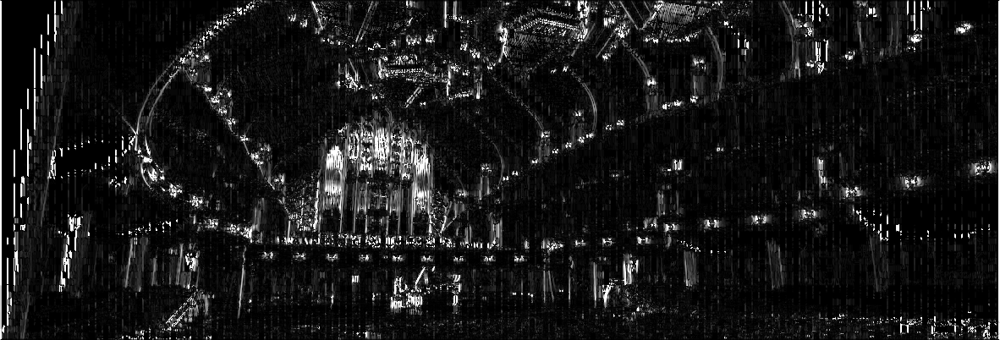

In [31]:
# Get edges of piano hsi
img_piano_hsi_edges = edges(deepcopy(img_piano_hsi))
cv2_imshow(img_piano_hsi_edges)

<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: divide by zero encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: invalid value encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:33: RuntimeWarning: invalid value encountered in sqrt
  f = np.sqrt(0.5 * ((g_xx + g_yy) + (g_xx - g_yy) * np.cos(2 * t) + 2 * g_xy * np.sin(2 * t)))


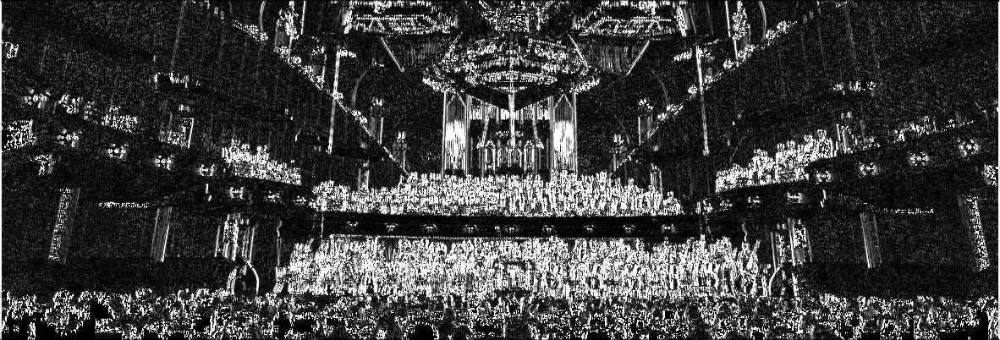

In [32]:
# Get edges of orchestra hsi
img_orch_hsi_edges = edges(deepcopy(img_orch_hsi))
cv2_imshow(img_orch_hsi_edges)

<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: divide by zero encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: invalid value encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:33: RuntimeWarning: invalid value encountered in sqrt
  f = np.sqrt(0.5 * ((g_xx + g_yy) + (g_xx - g_yy) * np.cos(2 * t) + 2 * g_xy * np.sin(2 * t)))


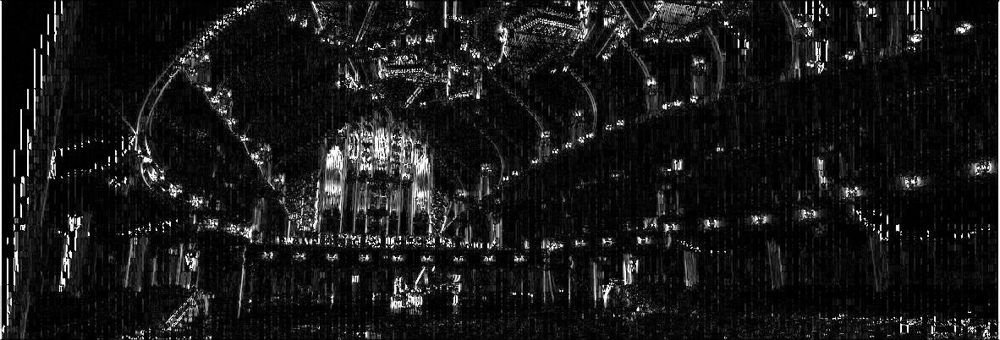

In [33]:
# Get edges of sharpened piano hsi
img_piano_hsi_sharp_edges = edges(deepcopy(img_piano_hsi_sharp))
cv2_imshow(img_piano_hsi_sharp_edges)

<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: divide by zero encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: invalid value encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:33: RuntimeWarning: invalid value encountered in sqrt
  f = np.sqrt(0.5 * ((g_xx + g_yy) + (g_xx - g_yy) * np.cos(2 * t) + 2 * g_xy * np.sin(2 * t)))


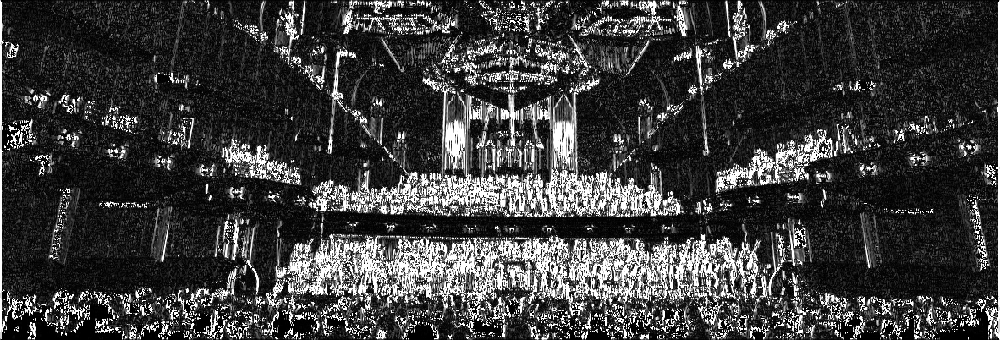

In [34]:
# Get edges of sharpened orchestra hsi
img_orch_hsi_sharp_edges = edges(deepcopy(img_orch_hsi_sharp))
cv2_imshow(img_orch_hsi_sharp_edges)

<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: divide by zero encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: invalid value encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:33: RuntimeWarning: invalid value encountered in sqrt
  f = np.sqrt(0.5 * ((g_xx + g_yy) + (g_xx - g_yy) * np.cos(2 * t) + 2 * g_xy * np.sin(2 * t)))


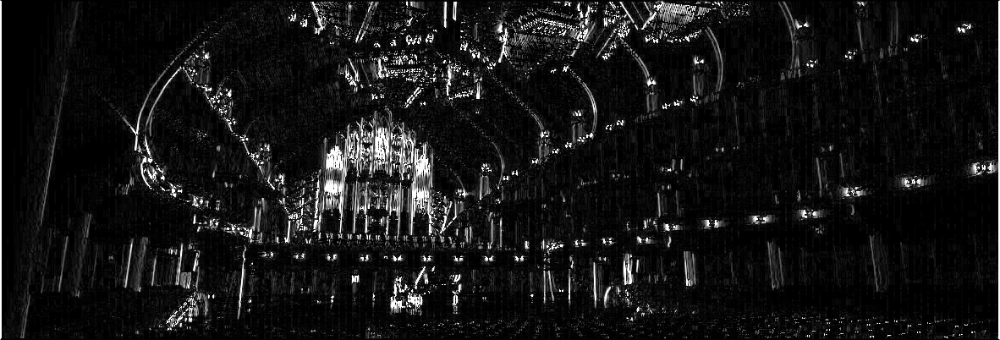

In [35]:
# Get edges of sharpened piano rgb
img_piano_rgb_sharp_edges = edges(deepcopy(img_piano_rgb_sharp))
cv2_imshow(img_piano_rgb_sharp_edges)

<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: divide by zero encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:30: RuntimeWarning: invalid value encountered in true_divide
  t = 0.5 * np.arctan((2 * g_xy) / (g_xx - g_yy))
<ipython-input-30-17dab54ad75e>:33: RuntimeWarning: invalid value encountered in sqrt
  f = np.sqrt(0.5 * ((g_xx + g_yy) + (g_xx - g_yy) * np.cos(2 * t) + 2 * g_xy * np.sin(2 * t)))


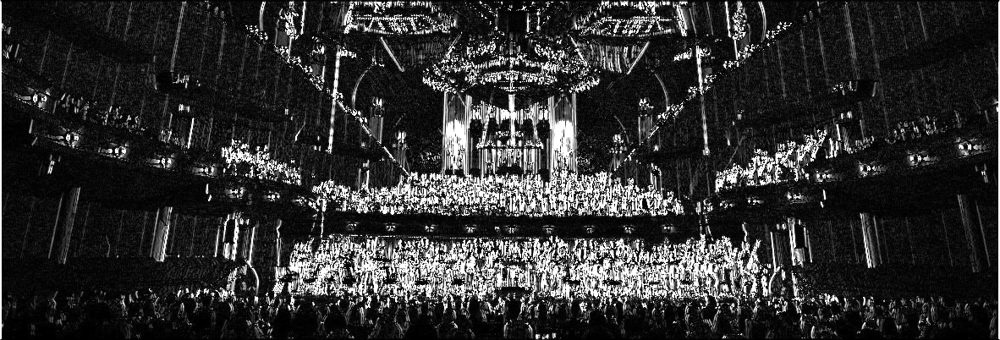

In [36]:
# Get edges of sharpened orchestra rgb
img_orch_rgb_sharp_edges = edges(deepcopy(img_orch_rgb_sharp))
cv2_imshow(img_orch_rgb_sharp_edges)